# Code for the model

## Import libraries and define functions

In [1]:
import itertools
import scipy
import networkx as nx
import random as rn
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from copy import deepcopy
from plotly.offline import plot
from IPython.core.display import display, HTML
config={'showLink': False, 'displayModeBar': False}

rn.seed(42)
colors = ["#313695", "#a50026", "#fee838", "#004529"]
status = ["susceptible", "exposed", "infectious", "recovered"]

%matplotlib inline

### Graph visualization functions

In [2]:
def plot_node_degree(graph):
    """
    Plots the node degree distribution
    :param graph: The graph to analyze
    :return: None
    """
    deg = [x[1] for x in list(nx.degree(graph))]
    fig, ax = plt.subplots()
    fig.set_size_inches(8, 5, forward=True)
    sns.distplot(deg, kde=True)
    ax.set_xticks(np.arange(0, 24, 2))
    plt.show()


def plot_community_degree(graph):
    """
    Plots the community degree distribution
    :param graph: The graph to analyze
    :return: None
    """
    temp = nx.get_node_attributes(graph, 'community')
    es = []
    for k in temp:
        for x in temp[k]:
            if k != x:
                es.append((k, x))
    fams = graph.edge_subgraph(es)
    deg = [x[1] for x in list(nx.degree(fams))]
    fig, ax = plt.subplots()
    fig.set_size_inches(8, 5, forward=True)
    sns.distplot(deg, kde=True)
    ax.set_xticks(np.arange(0, 20, 1))
    plt.show()


def plot_family_degree(graph):
    """
    Plots the family degree distribution
    :param graph: The graph to analyze
    :return: None
    """
    temp = nx.get_node_attributes(graph, 'family')
    es = []
    for k in temp:
        for x in temp[k]:
            if k != x:
                es.append((k, x))
    fams = graph.edge_subgraph(es)
    deg = [x[1] for x in list(nx.degree(fams))]
    fig, ax = plt.subplots()
    fig.set_size_inches(8, 5, forward=True)
    sns.distplot(deg, kde=True)
    ax.set_xticks(np.arange(0, 10, 1))
    plt.show()


def plot_seir(sus, exp, inf, rec):
    """
    Plots a SEIR graph for simulation results
    :param sus: List of number of sus at time step {index+1}
    :param exp: List of number of exp at time step {index+1}
    :param inf: List of number of inf at time step {index+1}
    :param rec: List of number of rec at time step {index+1}
    :return: None
    """
    plt.figure(figsize=(18, 10))
    plt.plot(range(len(sus)), sus, c=colors[0])
    plt.plot(range(len(exp)), exp, c=colors[1])
    plt.plot(range(len(inf)), inf, c=colors[2])
    plt.plot(range(len(rec)), rec, c=colors[3])
    plt.legend(status)
    plt.title("SEIR graph for simulation that lasted {} days".format(len(sus)))
    plt.show()


def plot_graph(G):
    """
    Plots the graph G
    :param G: The graph to plot
    :return: None
    """
    fig, ax = plt.subplots(figsize=(18, 10))
    pos = nx.spring_layout(G)
    for i in range(len(status)):
        node_subset = [x for x, y in G.nodes(data=True) if y["status"] == i]
        nx.draw_networkx_nodes(G, pos=pos, ax=ax, nodelist=node_subset, node_size=100,
                               node_color=colors[i], label=status[i], alpha=.75)
    nx.draw_networkx_edges(G, pos=pos, ax=ax, edge_color="#a2a2a2", alpha=.75)
    plt.legend()


### Definition of utility functions, mainly for compartmental model plus graph generation and family integration

To predict the potential severity of outbreaks of infectious diseases such as SARS, HIV, TB and smallpox, a summary parameter, the basic reproduction number R0, is generally calculated from a population-level model. R0 specifies the average number of secondary infections caused by one infected individual during his/her entire infectious period at the start of an outbreak. R0 isused to assess the severity of the outbreak, as well as the strength of the medical and/or behavioral interventions necessary forcontrol. Conventionally, it is assumed that if R0>1 the outbreak generates an epidemic, and if R0<1 the outbreak becomes extinct. 

In [3]:
t_se = 10.0
t_ei = 8.0
t_ir = 14.0 
t_er = 14.0
t_rs = 150.0
p_E_to_R = 0.179
R_0_start = 3
k = 2.5
R_0_end = 0.9
x0 = 90
gamma = 1.0/t_ir
    
    
def deriv(y, t, beta, N, t_ei, t_ir, t_er, t_rs, p_E_to_R):
    # Calculates the derivative, used for compartmental model with beta
    S, E, I, R = y

    dSdt = (R / t_rs) - (S * I * beta(t) / N)
    dEdt = (S * I * beta(t) / N) - (E / t_er) * p_E_to_R - (E / t_ei) * (1 - p_E_to_R)
    dIdt = (E / t_ei) * (1 - p_E_to_R) - I / t_ir
    dRdt = I / t_ir - R / t_rs
    return dSdt, dEdt, dIdt, dRdt


def logistic_R_0(t, R_0_start, k, x0, R_0_end):
    # Gets logistic R_0, used for compartmental model
    return (R_0_start - R_0_end) / (1 + np.exp(-k * (-t + x0))) + R_0_end


def beta(t):
    # Calculates beta for given time, used for compartmental model
    return logistic_R_0(t, R_0_start, k, x0, R_0_end) * gamma


def derivative(y, t, N, t_se, t_ei, t_ir, t_er, t_rs, p_E_to_R):
    # Calculates the derivative, used for compartmental model without beta
    S, E, I, R = y

    dSdt = (R / t_rs) - (S * I / N * t_se)
    dEdt = (S * I / N * t_se) - (E / t_er) * p_E_to_R - (E / t_ei) * (1 - p_E_to_R)
    dIdt = (E / t_ei) * (1 - p_E_to_R) - I / t_ir
    dRdt = I / t_ir - R / t_rs
    return dSdt, dEdt, dIdt, dRdt


def calculate_new_states_beta(days=1, exposed_0=5):
    # Calculates new states for compartmental model with beta
    # N = graph_size
    N = 1000
    y0 = N - exposed_0, exposed_0, 0.0, 0.0
    t = np.linspace(0, days - 1, days)
    ret = scipy.integrate.odeint(deriv, y0, t, args=(beta, N, t_ei, t_ir, t_er, t_rs, p_E_to_R))
    S, E, I, R = ret.T
    R_0_over_time = [beta(i) / gamma for i in range(len(t))]

    return t, S, E, I, R, R_0_over_time


def calculate_new_states(days=1, exposed_0=5):
    # Calculates new states for compartmental model without beta
    # N = graph_size
    N = 1000
    y0 = N - exposed_0, exposed_0, 0.0, 0.0
    t = np.linspace(0, days - 1, days)

    # Draw from distributions
    t_se = 10.0
    t_ei = 7.0
    t_ir = 14.0
    t_er = 14.0
    t_rs = 60
    p_E_to_R = 0.179

    ret = scipy.integrate.odeint(derivative, y0, t, args=(N, t_se, t_ei, t_ir, t_er, t_rs, p_E_to_R))
    S, E, I, R = ret.T

    return S, E, I, R


def generate_graph(num_nodes, tau1=2, tau2=5, mu=0.1, max_degree=15, average_degree=5,
                   min_community=6, max_community=30):
    """
    A function which generates a LFR benchmark graph with communities
    :param num_nodes: Number of nodes in the graph
    :param tau1: Tau1 parameter from LFR
    :param tau2: Tau2 parameter from LFR
    :param mu: Mu parameter from LFR
    :param max_degree: Maximum degree of a node
    :param average_degree: Average degree of a node
    :param min_community: Minimum number of nodes in a community
    :param max_community: Maxmimum number of nodes in a community
    :return: The graph G
    """
    G = nx.LFR_benchmark_graph(num_nodes, tau1, tau2, mu, average_degree, max_degree=max_degree,
                               min_community=min_community, max_community=max_community, seed=42)
    # Adding needed attributes used for graph model
    nx.set_node_attributes(G, 0, "status")
    nx.set_node_attributes(G, -1, "can_infect_again")
    nx.set_node_attributes(G, -1, "asymp")
    nx.set_node_attributes(G, 0, "time_in_state")
    return G


def add_families_to_graph(F, num_population):
    """
    A function which adds families to a graph F inplace
    :param F: The graph to which to add the families
    :param num_population: The population number for the graph
    :return: The graph with added families
    """
    # Used 2019 USA demographics to get these numbers
    num_family_members = [1, 2, 3, 4, 5, 6, 7]
    probabilities = [0.2837, 0.3451, 0.1507, 0.1276, 0.0578, 0.0226, 0.0125]

    family_total = 0
    families = []
    # Here we generate a list of number of family members
    while family_total < num_population:
        family_c = rn.choices(num_family_members, probabilities)[0]
        family_max = min(family_c, num_population - family_total)
        family_total += family_max
        families.append(family_max)
    n = 0
    # Populating the families
    for family_count in families:
        members_in_family = list(range(n, n + family_count, 1))
        edges = itertools.combinations(members_in_family, 2)
        # Connecting each family member in the graph
        F.add_edges_from(list(edges))
        for member in members_in_family:
            members_copy = members_in_family.copy()
            members_copy.remove(member)
            F.nodes[member]['family'] = members_copy
        n += family_count

    return F


def decision(probability):
    """
    Function which represents an event with probability equal to the probability argument
    :param probability: The probability for the event
    :return: True or False, whether the event happened or not
    """
    return rn.random() < probability

### Simulation functions

In [4]:
def run_simulation(G, params, show_seir=True, show_graph=False, ret_seir=False):
    """
    This function runs a graph based SEIRS simulation model
    :param G: The graph on which to run the simulation
    :param params: A dictionary of hyperparameters to be tested
    :param show_seir: Whether to plot the SEIRS plot
    :param show_graph: Whether to show the graph after the simulation has finished
    :param ret_seir: Whether to return the simulation values, only used by slider simulation function
    :return: Can return the Seir values, or None
    """
    # Copying graph in order to not make inline changes
    Graph = deepcopy(G)
    num_nodes = len(G.nodes)
    # Adding initial exposure according to the params value
    initial_exposed = params["initial_exposed"]
    # Defining all lists of states
    exposed = rn.sample(range(0, num_nodes - 1), initial_exposed)
    sus = list(set(range(0, num_nodes, 1)).difference(set(exposed)))
    infected = []
    recovered = []

    for i in exposed:
        # Switching state status for the exposed nodes
        Graph.nodes[i]["status"] = 1

    # Keeping track of number of nodes in each state over time to plot later on
    S = [num_nodes - initial_exposed]
    E = [initial_exposed]
    I = [0]
    R = [0]

    # Copying hyperparameters from the params dictionary
    t_ei = params["t_ei"]  # Average time in time units(day) to switch from exposed to infected
    t_rs = params["t_rs"]  # Average time in time units(day) to switch from recovered to susceptible
    reinfection = params["reinfection"]  # Probability that a recovered individual can reinfect again, only decided once
    # per node
    comm_talk_freq = params["comm_talk_freq"]  # The frequency with which a node communicates with nodes in the
    # community. More precisely, the number defines the average span in which the node communicates with every other
    # node in the community. For example if comm_talk_freq=3, that means that every node communicates once every 3 days
    # with every other node in its community (in random order)
    comm_talk_freq_change = params[
        "comm_talk_freq_change"]  # Increment/decrement to be used for the comm_talk_freq when
    # inducing quarantines
    other_talk_freq = params["other_talk_freq"]  # The frequency with which a node communicates with nodes
    # that aren't in its family or community analogous to the comm_talk_freq
    other_talk_freq_change = params["other_talk_freq_change"]  # Increment/decrement to be used for the other_talk_freq
    # when inducing quarantines
    p_E_to_R = params["p_er"]  # The probability of switching state from exposed to recovered (only if person is
    # asymptomatic)
    gray_mass = params[
        "gray_mass"]  # Probability that a person will get exposed no matter what happens at a certain time step due to
    # unknown reasons
    quarantine_nums = params["num_quarantines"]  # Number of quarantines in the time span of the simulation to be
    # generated
    quarantine_len = params["quarantine_len"]  # The quarantine length
    num_days = params["num_days"]  # Number of days the simulation lasts
    families = params["family"]  # Whether the graph has families or not
    beta = params["beta"]  # The beta value (explained below)

    # Dictionary to convert from status to number
    status = {"sus": 0, "exp": 1, "inf": 2, "rec": 3}

    # This section controls the quarantines(dynamic changes) if added as hyperparameters
    quarantine_cur_day = 0
    if quarantine_nums > 0:
        # This is the first day the quarantine starts. The quarantine also repeats itself every i*period_out days where
        # i = 1,2....etc
        period_out = int(num_days / quarantine_nums) - quarantine_len
    for i in range(num_days):
        if quarantine_nums > 0:
            if 0 < quarantine_cur_day < quarantine_len + 2:
                # Already in quarantine, communication reduced
                if quarantine_cur_day < 4:
                    # During the first 3 days of a quarantine we gradually decrease the communication between
                    # communities and other nodes
                    comm_talk_freq += comm_talk_freq_change
                    other_talk_freq += other_talk_freq_change
                elif quarantine_cur_day > quarantine_len - 2:
                    # During the last 3 days of a quarantine we gradually increase the communication between communities
                    # and other nodes back to normal
                    comm_talk_freq -= comm_talk_freq_change
                    comm_talk_freq = max(0, comm_talk_freq)
                    other_talk_freq -= other_talk_freq_change
                    other_talk_freq = max(0, other_talk_freq)
                # Day finished
                quarantine_cur_day += 1
            else:
                # Quarantine finished, reset variables
                comm_talk_freq = params["comm_talk_freq"]
                other_talk_freq = params["other_talk_freq"]
                quarantine_cur_day = 0
            if quarantine_nums > 0 and (i + 1) % period_out == 0:
                # Quarantine start
                quarantine_cur_day += 1

        # This section controls probability based state shifts for every node in the graph in a single time unit (day)
        for j in range(num_nodes):
            Graph.nodes[j]["time_in_state"] += 1
            # Recovered to susceptible state change
            # A recovered person can only transition to susceptible
            sus_now = False  # Variables of these type make sure that we don't induce 2 state changes for a single node
            # in a single day
            if Graph.nodes[j]["status"] == status["rec"]:
                # If can_infect_again = 1, that means that the person was already checked for reinfection and it was
                # concluded that he can reinfect again so we check for the transition
                if Graph.nodes[j]["can_infect_again"] == 1:
                    # If yes, then we test if the recovered person can transition to sus with the parameter t_rs
                    p_r_to_s = 1.0 / t_rs
                    choice = decision(p_r_to_s)
                    if choice:
                        # If the event happened, we change the state of the node
                        Graph.nodes[j]["status"] = status["sus"]
                        Graph.nodes[j]["time_in_state"] = 0  # reseting time in state
                        recovered.remove(j)
                        sus.append(j)
                        sus_now = True
                        Graph.nodes[j]["can_infect_again"] = -1  # We also set this variable to be -1 in order for the
                        # node to be applicable to be tested again in the future for possible reinfection
                elif Graph.nodes[j]["can_infect_again"] == -1:
                    # If we still haven't decided for the given node whether it can reinfect or not, we decide
                    choice = decision(reinfection)
                    if choice:
                        # Meaning the node can reinfect
                        # Decide prob of transition
                        inner_choice = decision(1 / t_rs)
                        if inner_choice:
                            # Transitioning to sus
                            sus_now = True
                            Graph.nodes[j]["status"] = status["sus"]
                            Graph.nodes[j]["time_in_state"] = 0
                            Graph.nodes[j]["can_infect_again"] = -1
                            recovered.remove(j)
                            sus.append(j)
                        else:
                            # Flag for check
                            Graph.nodes[j]["can_infect_again"] = 1
                    else:
                        # The node can't reinfect so we just keep it in the recovered state
                        Graph.nodes[j]["can_infect_again"] = 0
            # Susceptible to exposed state change A susceptible person can only transition to exposed. Factors which
            # affect this transition are the rate of contact, beta = β (“beta”), the expected amount of people an
            # infected person infects per day and the number of contacts. The beta can be used to derive the
            # probability that a random individiual will get infected when contacting an infected person. This
            # probability = beta/N^ where N^ is equal to the average number of contacts the infected person sees per
            # day (or his rate of contact). This means that the total probability of transition is 1 -
            # product_i:infected_neighbors(1-beta/N^_i). (1-beta/N^_i) is the probability that infected person i
            # which you are in contact with and see doesn't infect you. The product is the probability that no one of
            # the infected people you meet that day infects you. 1-this is the probability that at least one of them
            # infects you. We need to integrate here knowledge about whether the contacts are in a family,
            # in a community or other contacts in order to see the rate of communication between the target node and
            # them. So, out of all infected neighbors of node j, we always take into account family members,
            # we take into account community members every comm_talk_freq days (1/comm_talk_freq chance that j will
            # see a community friend) and every other contact we see every other_talk_freq days(1/other_talk_freq
            # chance that j will see something else(not in community nor family)). The chance to see a community
            # person who is infected is 1/(comm_talk_freq) * number of infected community neighbors/all neighbors.
            # Same as other members. We use this to derive the final formula : 1-[(1-beta/N_1..*)^family_count)* (
            # 1-beta/N_1..* + freq_community-1/freq_community)^community_count * (1-beta/N_1..* +
            # freq_other-1/freq_other)^other_count
            exp_now = False
            if Graph.nodes[j]["status"] == status["sus"] and not sus_now:
                if not exp_now:
                    neighbors = [n for n in Graph.neighbors(j)]
                    family = []
                    if families:
                        # Get all family members for the node
                        family = [neighbor for neighbor in neighbors if
                                  neighbor in Graph.nodes[j]["family"]]
                    community = list(Graph.nodes[j]["community"])
                    # Get all community members for the node
                    community_final = [n for n in community if n in neighbors and n not in family]
                    if j in community_final:
                        community_final.remove(j)  # Remove itself
                    # Get all other members for node (not family and not community but neighbors, usually a small
                    # number because of the graph generation process)
                    other = [neighbor for neighbor in neighbors if
                             neighbor not in family and neighbor not in community_final]
                    if j in other:
                        other.remove(j)  # Remove itself if inside

                    # This mulitplier will represent the probability that no one from all the infected nodes the target
                    # node knows and sees, will infect them (the product of 1-beta/N^ for all infected neighbors)
                    multiplier = 1  # Starting from 1, meaning 0 change to infect
                    for family_member in family:
                        # Now we check for each family member of the node, which of them is infected
                        if Graph.nodes[family_member]["status"] == status["inf"]:  # if family node is infected
                            # Since a family node is infected, we need to analyze its connections and how many nodes
                            # in average this family members communicates with on a daily basis
                            neighbors_in = [n for n in Graph.neighbors(family_member)]
                            family_in = []
                            if families:
                                family_in = [neighbor for neighbor in neighbors_in if
                                             neighbor in Graph.nodes[family_member]["family"]]
                            community_in = list(Graph.nodes[family_member]["community"])
                            community_final_in = [n for n in community_in if n in neighbors_in and n not in family_in]
                            if family_member in community_final_in:
                                community_final_in.remove(family_member)  # Removing itself
                            other_in = [n for n in neighbors_in if n not in family_in and n not in community_final_in]
                            if family_member in other_in:
                                other_in.remove(family_member)  # Removing itself

                            # Now we find the average people this family node sees per day
                            average_people_met = len(family_in)
                            if comm_talk_freq > 0:
                                average_people_met += (float(len(community_final_in)) / comm_talk_freq)
                            if other_talk_freq > 0:
                                average_people_met += (float(len(other_in)) / other_talk_freq)

                            if average_people_met == 0:
                                multiplier *= (1 - beta)
                            else:
                                if beta / average_people_met <= 1:
                                    # Now this term (1 - beta / average_people_met) gets added to the final product and
                                    # represents the probability that this family member won't infect the node j on this
                                    # day
                                    multiplier *= (1 - beta / average_people_met)
                    for community_member in community_final:
                        # We do the same for every infected community member also
                        if Graph.nodes[community_member]["status"] == status["inf"]:  # if community infected
                            neighbors_in = [n for n in Graph.neighbors(community_member)]
                            family_in = []
                            if families:
                                family_in = [neighbor for neighbor in neighbors_in if
                                             neighbor in Graph.nodes[community_member]["family"]]
                            community_in = list(Graph.nodes[community_member]["community"])
                            community_final_in = [n for n in community_in if n in neighbors_in and n not in family_in]
                            if community_member in community_final_in:
                                community_final_in.remove(community_member)  # Removing itself
                            other_in = [n for n in neighbors_in if n not in family_in and n not in community_final_in]
                            if community_member in other_in:
                                other_in.remove(community_member)  # Removing itself
                            average_people_met = len(family_in)
                            if comm_talk_freq > 0:
                                average_people_met += (float(len(community_final_in)) / comm_talk_freq)
                            if other_talk_freq > 0:
                                average_people_met += (float(len(other_in)) / other_talk_freq)
                            if average_people_met == 0:
                                if comm_talk_freq == 0:
                                    multiplier = 1
                                else:
                                    if beta / comm_talk_freq <= 1:
                                        multiplier *= (1 - beta / comm_talk_freq)
                            else:
                                if comm_talk_freq == 0:
                                    if beta / average_people_met <= 1:
                                        multiplier *= (1 - beta / average_people_met)
                                else:
                                    if beta / (average_people_met * comm_talk_freq) <= 1:
                                        # Here we also add the parameter comm_talk_freq in order to integrate the
                                        # knowledge that the infected person is in our community so we only see him
                                        # every comm_talk_freq days
                                        multiplier *= (1 - beta / (average_people_met * comm_talk_freq))
                    for other_member in other:
                        # Same for all other members
                        if Graph.nodes[other_member]["status"] == status["inf"]:  # if other infected
                            neighbors_in = [n for n in Graph.neighbors(other_member)]
                            family_in = []
                            if families:
                                family_in = [neighbor for neighbor in neighbors_in if
                                             neighbor in Graph.nodes[other_member]["family"]]
                            community_in = list(Graph.nodes[other_member]["community"])
                            community_final_in = [n for n in community_in if n in neighbors_in and n not in family_in]
                            if other_member in community_final_in:
                                community_final_in.remove(other_member)  # Removing itself
                            other_in = [n for n in neighbors_in if n not in family_in and n not in community_final_in]
                            if other_member in other_in:
                                other_in.remove(other_member)  # Removing itself
                            average_people_met = len(family_in)
                            if comm_talk_freq > 0:
                                average_people_met += (float(len(community_final_in)) / comm_talk_freq)
                            if other_talk_freq > 0:
                                average_people_met += (float(len(other_in)) / other_talk_freq)
                            if average_people_met == 0:
                                if other_talk_freq == 0:
                                    multiplier = 1
                                else:
                                    if beta / other_talk_freq <= 1:
                                        multiplier *= (1 - beta / other_talk_freq)
                            else:
                                if other_talk_freq == 0:
                                    if beta / average_people_met <= 1:
                                        multiplier *= (1 - beta / average_people_met)
                                else:
                                    if beta / (average_people_met * other_talk_freq) <= 1:
                                        # Here we use the other talk freq
                                        multiplier *= (1 - beta / (average_people_met * other_talk_freq))

                    # The final probability of infection is 1-multipler+gray_mass, because the multipler represents
                    # the probability that not a single infected person we know will infect us that day, so we just look
                    # for the opposite event. The gray mass is always added as a flat probability
                    probability_of_infection = 1 - multiplier + gray_mass
                    # It is important to note that this probability will never exceed 1+gray_mass

                    choice = decision(probability_of_infection)
                    if choice:
                        # If the person is exposed we switch his status
                        Graph.nodes[j]["status"] = status["exp"]
                        Graph.nodes[j]["time_in_state"] = 0
                        sus.remove(j)
                        exposed.append(j)
                        exp_now = True
            # Exposed to infected/recovered state change
            # An exposed person can either become infected(infectious) in t_ei days or
            # become asympt in t_er days. The probability an exposed person becomes asympt at day 1 of exposure is
            # p_E_to_R (decided at day 1 for every person - the next day after exposure/ during this day the person
            # can't infect anyone). This means that for every node we first have to decide whether or not the exposed
            # node will be asympt or not. If it is then, the probability of transitioning to recovered is 1/t_er. If
            # it isn't, the probability of transitioning to infected is 1/t_ei.
            inf_now = False
            if Graph.nodes[j]["status"] == status["exp"] and not exp_now:
                if Graph.nodes[j]["asymp"] != -1:
                    # This means we have already decided whether or not the person is asympt.
                    if Graph.nodes[j]["asymp"] == 1:  # asympt
                        # We sample the probability to go from exp to rec from neg binom (derived from paper)
                        sample = scipy.stats.nbinom.pmf(Graph.nodes[j]["time_in_state"], 6, 0.35)
                        choice = decision(sample)
                        if choice:
                            # State change
                            Graph.nodes[j]["status"] = status["rec"]
                            Graph.nodes[j]["time_in_state"] = 0
                            exposed.remove(j)
                            recovered.append(j)
                    else:
                        # The person is not asympt so he will infect and spread the virus, regulated by t_ei
                        choice = decision(1.0 / t_ei)
                        if choice:
                            Graph.nodes[j]["status"] = status["inf"]
                            Graph.nodes[j]["time_in_state"] = 0
                            exposed.remove(j)
                            infected.append(j)
                            inf_now = True
                else:  # Haven't decided whether the person is asympt or not
                    choice = decision(p_E_to_R)  # Deciding asympt
                    if choice:
                        Graph.nodes[j]["asymp"] = 1  # asympt
                        # Neg bin again
                        sample = scipy.stats.nbinom.pmf(Graph.nodes[j]["time_in_state"], 6, 0.35)
                        choice = decision(sample)
                        if choice:
                            Graph.nodes[j]["status"] = status["rec"]
                            Graph.nodes[j]["time_in_state"] = 0
                            exposed.remove(j)
                            recovered.append(j)
                    else:  # not asympt
                        Graph.nodes[j]["asymp"] = 0
                        choice = decision(1.0 / t_ei)
                        if choice:
                            Graph.nodes[j]["status"] = status["inf"]
                            Graph.nodes[j]["time_in_state"] = 0
                            exposed.remove(j)
                            infected.append(j)
                            inf_now = True
            # Infected to recovered state change
            # An infected person can only recover. An infected person recovers after with a neg binom dist
            if Graph.nodes[j]["status"] == status["inf"] and not inf_now:
                sample = scipy.stats.nbinom.pmf(Graph.nodes[j]["time_in_state"], 6, 0.35)
                choice = decision(sample)
                if choice:
                    Graph.nodes[j]["status"] = status["rec"]
                    Graph.nodes[j]["time_in_state"] = 0
                    infected.remove(j)
                    recovered.append(j)

        # Finally appending the values for S,E,I,R after day i
        S.append(num_nodes - len(exposed) - len(infected) - len(recovered))
        E.append(len(exposed))
        I.append(len(infected))
        R.append(len(recovered))

    if show_seir:
        plot_seir(S, E, I, R)
    if show_graph:
        plot_graph(Graph)
    if ret_seir:
        return [S, E, I, R]


def slider_simulation(G, params, slide_by='beta', values=np.arange(1, 3, 0.5), show_graph=False):
    """
    This function makes a slider simulation, where the slider variable is the defined by the slide_by parameter. This
    allows for ablation studies and interesting comparion plots for certain parameters(for example beta, number of
    quarantines etc..)
    :param G: The graph to plot for
    :param params: The params dictionary
    :param slide_by: The variable to be used for the slider
    :param values: The values of the slider variable to plot for
    :param show_graph: Whether to show the graph
    :return: None
    """
    num_days = params["num_days"]
    fig = go.Figure(layout=dict(title="SEIR model, number of days: {}, {}: {} ".format(num_days, slide_by, values[0])))
    x = list(range(0, num_days + 1))
    for v in values:
        params[slide_by] = v
        seir = run_simulation(G, params, show_graph=show_graph, show_seir=False, ret_seir=True)
        for i, s in enumerate(seir):
            fig.add_trace(
                go.Scatter(
                    visible=False,
                    line=dict(width=1, color=colors[i]),
                    name=status[i],
                    x=x,
                    y=s
                )
            )
    for j in range(4):
        fig.data[j].visible = True
    steps = []
    for i in range(len(values)):
        step = dict(
            method="update",
            label="{}".format(values[i]),
            args=[{"visible": [False] * len(fig.data) * 4},
                  {"title": "SEIR model, number of days: {}, {}: {} ".format(num_days, slide_by, values[i])}],
        )
        for j in range(4):
            step["args"][0]["visible"][4 * i + j] = True
        steps.append(step)
    sliders = [dict(
        active=0,
        currentvalue={"prefix": f"{slide_by}: "},
        pad={"t": 50},
        steps=steps)]
    fig.update_layout(sliders=sliders, template="plotly_white", showlegend=True, width=750, height=575)
    plot(fig, filename = 'fig.html', config = config)
    display(HTML('fig.html'))

## Models

### Compartmental model

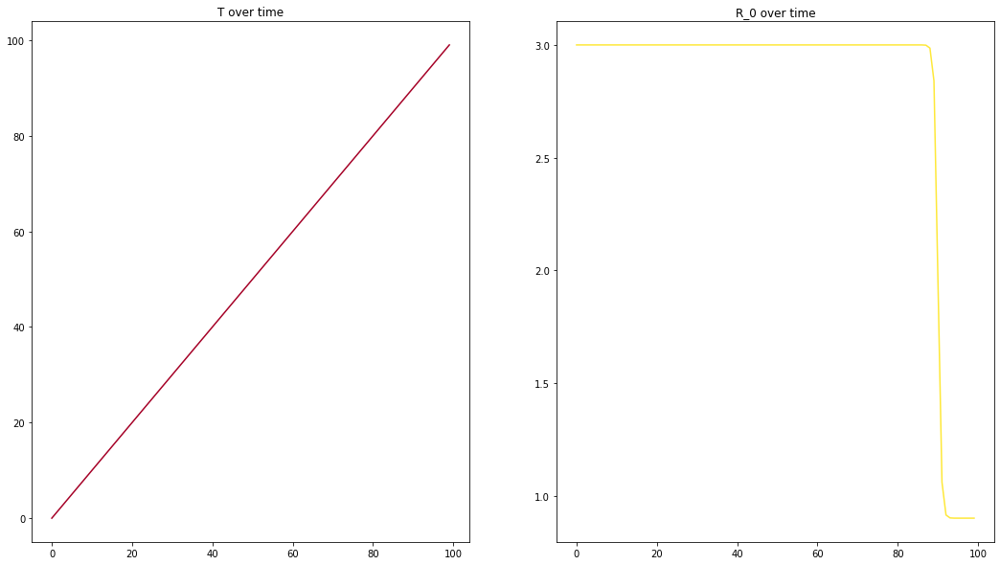

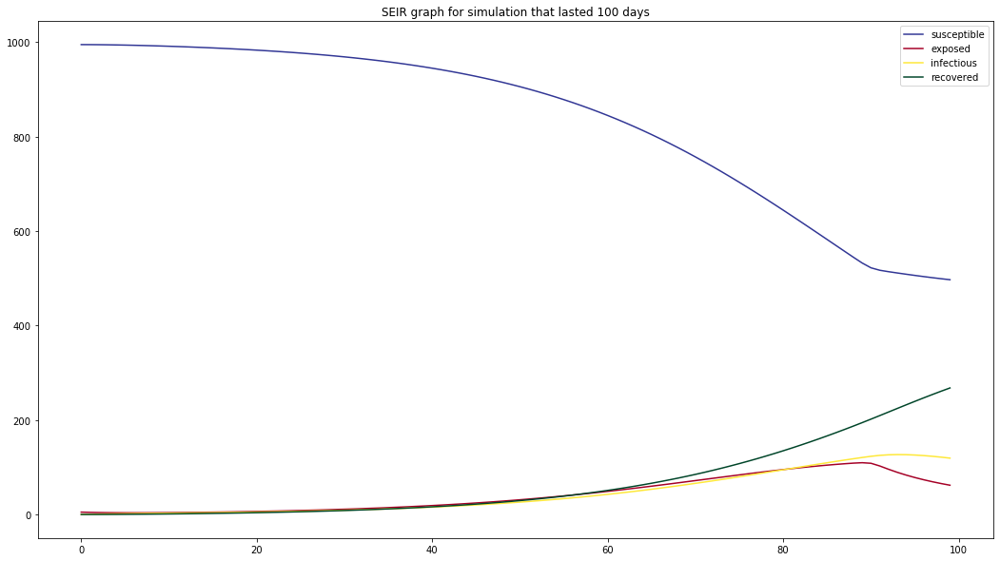

In [5]:
# With beta over time
days = 100
res_100 = calculate_new_states_beta(days = days)
t = res_100[0]
R_0_over_time = res_100[-1]
fig = plt.figure(figsize=(18,10))
plt.subplot(1,2,1)
plt.plot(range(days), t, c=colors[1])
plt.title("T over time")
plt.subplot(1,2,2)
plt.plot(range(days), R_0_over_time, c=colors[2])
plt.title("R_0 over time")
plt.show()
plot_seir(res_100[1],res_100[2],res_100[3],res_100[4])

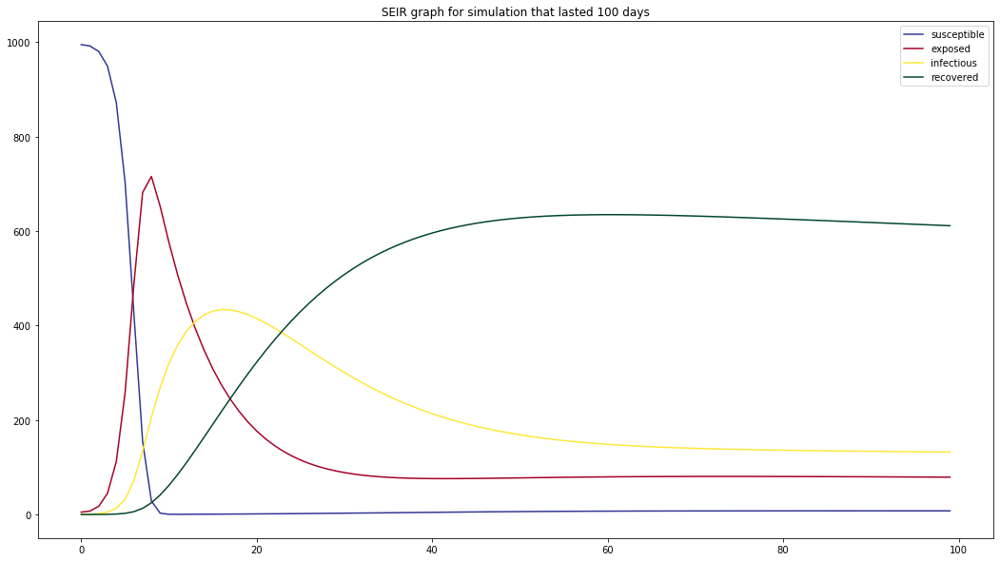

In [6]:
# No beta
days = 100
res_100 = calculate_new_states(days = days)
plot_seir(res_100[0],res_100[1],res_100[2],res_100[3])

### Graph based model

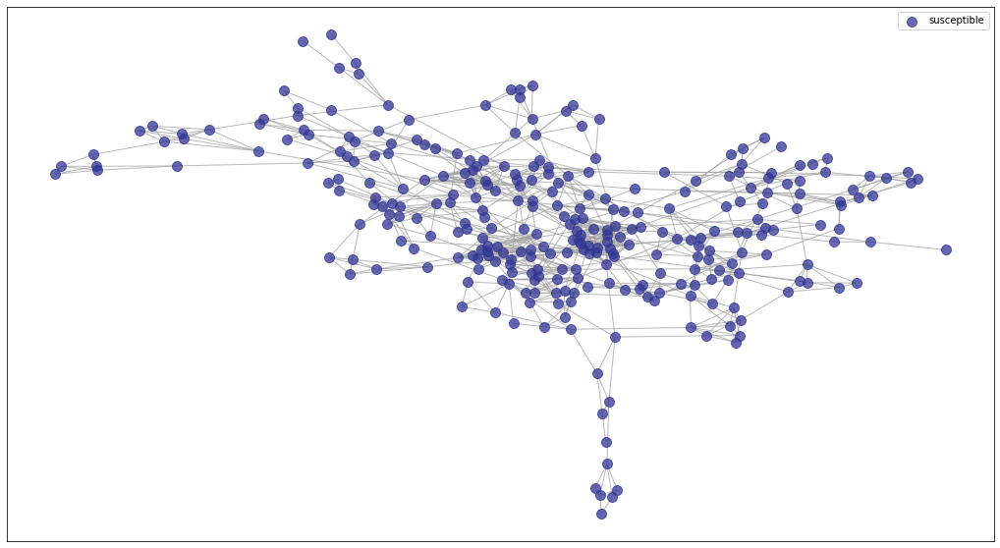

In [7]:
num_nodes = 301
G = generate_graph(num_nodes)
plot_graph(G)

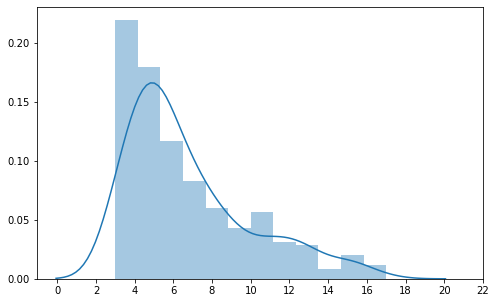

The number of connected components in the graph is 1
The diameter of the graph is 12
The average clustering coefficient of the graph is 0.4574749171094685


In [8]:
plot_node_degree(G)
print("The number of connected components in the graph is {}".format(len(list(nx.connected_components(G)))))
print("The diameter of the graph is {}".format(nx.algorithms.distance_measures.diameter(G)))
print("The average clustering coefficient of the graph is {}".format(nx.algorithms.cluster.average_clustering(G)))

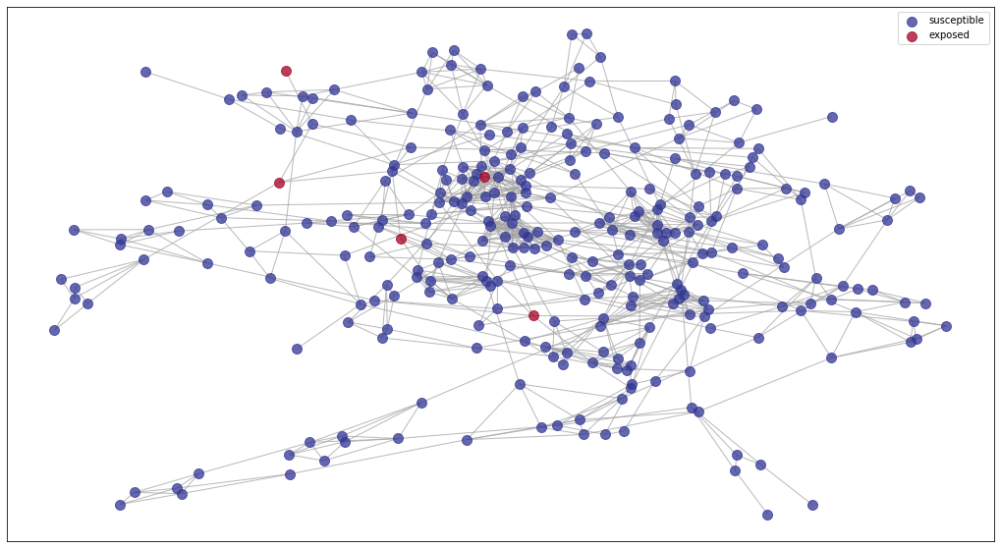

In [9]:
# Visualizing initial exposure

initial_exposed = 5
exposed = [rn.randint(0, num_nodes-1) for i in range(initial_exposed)]
infected = []
recovered = []
G_copy = deepcopy(G)
for i in exposed:
    G.nodes[i]["status"] = 1
plot_graph(G)

In [10]:
# Defining first params dictionary which will not include quarantines nor families, simulation is for 500 days
params = {
        "family": False,
        "num_days": 500,
        "initial_exposed": 5,
        "beta": 0,
        "num_quarantines": 0,
        "quarantine_len": 0,
        "t_ei": 8,
        "t_rs": 150,
        "reinfection": 0.17,
        "comm_talk_freq": 6,
        "comm_talk_freq_change": 0,
        "other_talk_freq": 10,
        "other_talk_freq_change": 0,
        "p_er": 0.179,
        "gray_mass": 0.0001
    }

In [11]:
# Making a slider simulation for beta without quarantine and without families added
slider_simulation(G_copy, params, slide_by="beta", values=np.arange(1,4,0.5))

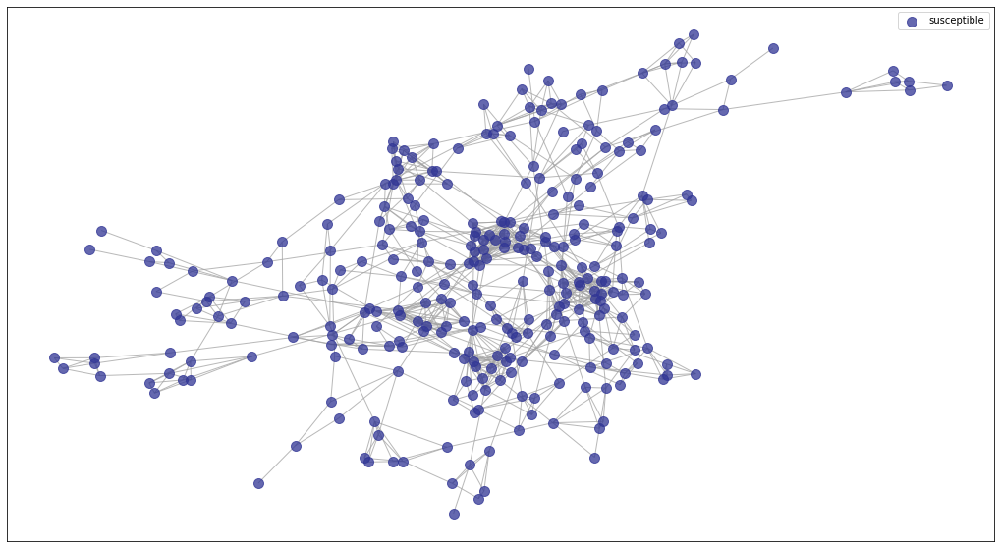

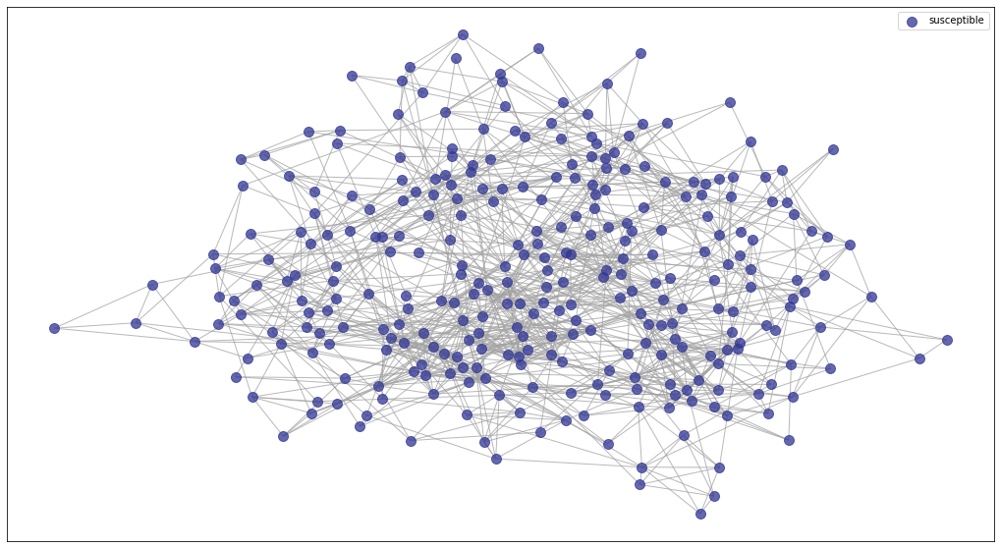

In [12]:
# Adding families to the graph
F = add_families_to_graph(deepcopy(G_copy), num_nodes)

# Plotting with no families
plot_graph(G_copy)

# Plotting with families
plot_graph(F)

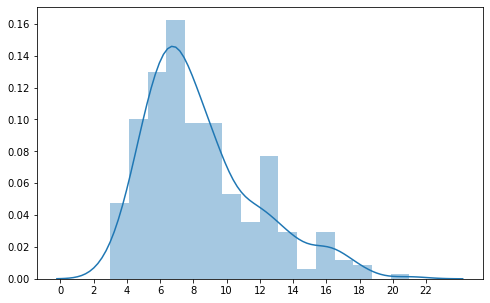

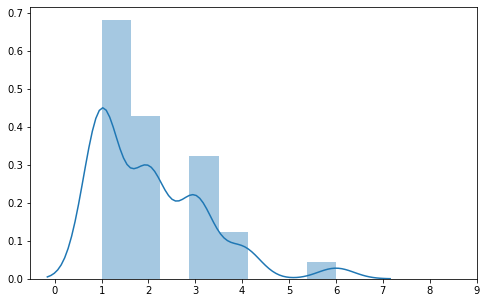

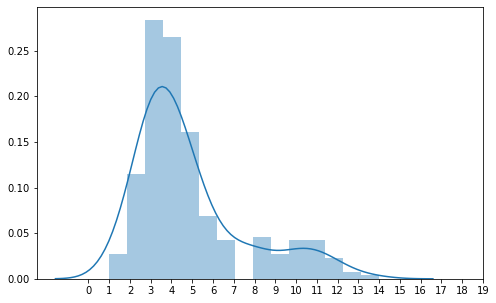

The number of connected components in the graph is 1
The diameter of the graph is 12
The average clustering coefficient of the graph is 0.4574749171094685


In [13]:
plot_node_degree(F)
plot_family_degree(F)
plot_community_degree(F)
print("The number of connected components in the graph is {}".format(len(list(nx.connected_components(G)))))
print("The diameter of the graph is {}".format(nx.algorithms.distance_measures.diameter(G)))
print("The average clustering coefficient of the graph is {}".format(nx.algorithms.cluster.average_clustering(G)))

In [14]:
# Defining second params dictionary which will not include quarantines but will include families, 
# simulation is for 500 days
params_2 = {
        "family": True,
        "num_days": 500,
        "initial_exposed": 5,
        "beta": 0,
        "num_quarantines": 0,
        "quarantine_len": 0,
        "t_ei": 8,
        "t_rs": 150,
        "reinfection": 0.17,
        "comm_talk_freq": 6,
        "comm_talk_freq_change": 0,
        "other_talk_freq": 10,
        "other_talk_freq_change": 0,
        "p_er": 0.179,
        "gray_mass": 0.0001
    }

In [15]:
# Making a slider simulation for beta without quarantine and with families added
slider_simulation(F, params_2, slide_by="beta", values=np.arange(1,4,0.5))

#### Let's add quarantines to the timeline

In [16]:
params_3 = {
        "family": True,
        "num_days": 500,
        "initial_exposed": 5,
        "beta": 3,
        "num_quarantines": 10,
        "quarantine_len": 14,
        "t_ei": 8,
        "t_rs": 150,
        "reinfection": 0.17,
        "comm_talk_freq": 6,
        "comm_talk_freq_change": 2,
        "other_talk_freq": 10,
        "other_talk_freq_change": 2,
        "p_er": 0.2,
        "gray_mass": 0.0001
    }

In [17]:
# Making a slider simulation for beta with quarantine and with families added
slider_simulation(F, params_3, slide_by="beta", values=np.arange(1,4,0.5))

In [18]:
# Making a slider simulation for beta=3 with number of quarantines as a dependent variable
slider_simulation(F, params_3, slide_by="num_quarantines", values=np.arange(0,14,1))